# Nama : Willibrordus Bayu
# NIM : 00000034000
# Kelas : B

In [1]:
#import library
import numpy as np
import pandas as pd
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
import plotly.express as px
import plotly.graph_objects as go

## Paris Housing Classification

In [2]:
#load dataset
df_housing = pd.read_csv('ParisHousingClass99.88.csv')
df_housing.head()

,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom,price,category
0,75523,3,0,1,63,9373,3,8,2005,0,1,4313,9005,956,0,7,7559081.5,Basic
1,80771,39,1,1,98,39381,8,6,2015,1,0,3653,2436,128,1,2,8085989.5,Luxury
2,55712,58,0,1,19,34457,6,8,2021,0,0,2937,8852,135,1,9,5574642.1,Basic
3,32316,47,0,0,6,27939,10,4,2012,0,1,659,7141,359,0,3,3232561.2,Luxury
4,70429,19,1,1,90,38045,3,7,1990,1,0,8435,2429,292,1,4,7055052.0,Luxury


In [3]:
#check columns and rows of dataset
df_housing.shape

(10000, 18)

In [4]:
#check missing value
df_housing.isnull().sum()

squareMeters         0
numberOfRooms        0
hasYard              0
hasPool              0
floors               0
cityCode             0
cityPartRange        0
numPrevOwners        0
made                 0
isNewBuilt           0
hasStormProtector    0
basement             0
attic                0
garage               0
hasStorageRoom       0
hasGuestRoom         0
price                0
category             0
dtype: int64

In [5]:
#split data
X = df_housing.iloc[:, 0:17].values
y = df_housing.iloc[:, 17].values
print(X)

[[7.5523000e+04 3.0000000e+00 0.0000000e+00 ... 0.0000000e+00
  7.0000000e+00 7.5590815e+06]
 [8.0771000e+04 3.9000000e+01 1.0000000e+00 ... 1.0000000e+00
  2.0000000e+00 8.0859895e+06]
 [5.5712000e+04 5.8000000e+01 0.0000000e+00 ... 1.0000000e+00
  9.0000000e+00 5.5746421e+06]
 ...
 [8.3841000e+04 3.0000000e+00 0.0000000e+00 ... 1.0000000e+00
  9.0000000e+00 8.3900305e+06]
 [5.9036000e+04 7.0000000e+01 0.0000000e+00 ... 1.0000000e+00
  4.0000000e+00 5.9051070e+06]
 [1.4400000e+03 8.4000000e+01 0.0000000e+00 ... 1.0000000e+00
  6.0000000e+00 1.4670840e+05]]


In [6]:
#scale the data to be between -1 and 1
sc = StandardScaler()
X_std = sc.fit_transform(X)

#print standarization
print(X_std)

[[ 0.89156241 -1.64351831 -1.01755405 ... -1.00601811  0.63137326
   0.89168721]
 [ 1.07395603 -0.39418009  0.98274878 ...  0.99401789 -0.9428096
   1.07481431]
 [ 0.20303346  0.26519286 -1.01755405 ...  0.99401789  1.26104641
   0.20199443]
 ...
 [ 1.18065352 -1.64351831 -1.01755405 ...  0.99401789  1.26104641
   1.18048389]
 [ 0.31855868  0.68163893 -1.01755405 ...  0.99401789 -0.31313646
   0.31684765]
 [-1.68318347  1.16749268 -1.01755405 ...  0.99401789  0.31653669
  -1.6844863 ]]


In [7]:
#calculate covariance matrix
cov_mat = np.cov(X_std.T)
print('cov_matrix shape:', cov_mat.shape)
print('Covariance_matrix', cov_mat)

cov_matrix shape: (17, 17)
Covariance_matrix [[ 1.00010001e+00  9.57373337e-03 -6.65051982e-03 -5.59489486e-03
   1.10942481e-03 -1.54070778e-03  8.75909601e-03  1.66203282e-02
  -7.20786880e-03 -1.06681901e-02  7.48078509e-03 -3.96067986e-03
  -5.88096676e-04 -1.72476271e-02 -3.48663837e-03 -6.23016099e-04
   1.00009937e+00]
 [ 9.57373337e-03  1.00010001e+00 -1.12411839e-02  1.70171261e-02
   2.22464742e-02  9.04055424e-03  8.34097948e-03  1.67675389e-02
   3.97882950e-03 -2.86526247e-03 -1.65652164e-03 -1.39914149e-02
   1.20618426e-02  2.31900993e-02 -4.76020716e-03 -1.55303443e-02
   9.59186512e-03]
 [-6.65051982e-03 -1.12411839e-02  1.00010001e+00  1.55155779e-02
  -8.83213616e-04  6.76057958e-03  5.02384639e-03  4.27984970e-03
   2.21380658e-03 -8.37079778e-03 -7.59843022e-03 -8.55893041e-03
  -3.08522826e-03 -4.62611498e-03 -9.50696091e-03 -7.27645557e-03
  -6.11985687e-03]
 [-5.59489486e-03  1.70171261e-02  1.55155779e-02  1.00010001e+00
  -4.00674050e-03  8.07278750e-03  1.461

In [8]:
#calculate eigen values & eigen vectors
eigenvalues, eigenvectors = np.linalg.eig(cov_mat)
print('Eigen Vectors \n%s', eigenvectors)
print('\n Eigen Values \n%s', eigenvalues)

Eigen Vectors 
%s [[ 7.06365244e-01  7.07108445e-01 -3.78342210e-03  4.31594727e-03
  -2.52084067e-04  4.92056291e-03 -2.20238491e-03 -3.95220265e-03
  -3.31121199e-04  7.80992619e-03  1.09852780e-02 -8.81946698e-03
   1.82375072e-02 -5.66824589e-03  4.61017099e-03  1.75238998e-02
  -3.93211048e-03]
 [ 1.35396029e-02  1.78195983e-06  4.59017322e-01 -7.98858890e-02
   4.46612237e-01  2.63260608e-01 -5.93379345e-02 -1.62134200e-01
   3.36011349e-01 -1.24790800e-02  2.25679098e-01 -1.65656618e-01
  -1.97376892e-01  2.35863134e-01 -1.39022795e-01 -4.14849969e-01
   8.19236275e-02]
 [-8.88326555e-03  3.70087799e-04 -3.38700114e-02 -2.25261852e-01
   2.12766854e-01  1.01402285e-01  4.18680834e-01 -2.46607504e-01
   2.54558908e-01  6.38498068e-02 -4.28849333e-03  3.86511873e-02
  -1.58006342e-01 -3.90149348e-01 -3.68529093e-01  5.15577874e-01
   8.46387399e-02]
 [-7.53282625e-03  3.65816074e-04  8.65100893e-02 -1.19800606e-01
  -2.29712526e-01  3.42052649e-01  4.81936027e-01  1.06843632e-01
 

In [9]:
eig_pairs = [(eigenvalues[index], eigenvectors[:,index]) for index in range(len(eigenvalues))]

#sort the (eigenvalue, eigenvector) pairs from highest to lowest with respect to eigenvalue
eig_pairs.sort()
eig_pairs.reverse()
print(eig_pairs)

#extract the descending ordered eigenvalues and eigenvectors
eigvalues_sorted = [eig_pairs[index][0] for index in range(len(eigenvalues))]
eigvectors_sorted = [eig_pairs[index][1] for index in range(len(eigenvalues))]

#let's confirm our sorting worked, print out eigenvalues
print('\n')
print('Eigenvalues in descending order: \n%s' %eigvalues_sorted)

[(2.002318011969686, array([ 0.70636524,  0.0135396 , -0.00888327, -0.00753283,  0.00180515,
       -0.00230917,  0.01260246,  0.02340444, -0.00994869, -0.01541804,
        0.01062751, -0.00527552, -0.00083877, -0.02370883, -0.00505751,
       -0.00117855,  0.70636162])), (1.0772807114841483, array([-0.00378342,  0.45901732, -0.03387001,  0.08651009,  0.32009328,
        0.07224684,  0.12423539,  0.41283616,  0.16220046, -0.11990811,
        0.01879166,  0.0091698 ,  0.1217732 ,  0.49330809,  0.25831283,
       -0.34794562, -0.00357134])), (1.0571991556376112, array([ 0.00431595, -0.07988589, -0.22526185, -0.11980061, -0.11592883,
       -0.20015297, -0.28714801,  0.19994702, -0.16230439,  0.28371355,
        0.08126399, -0.30717193, -0.04966098,  0.23257312,  0.5569761 ,
        0.42187802,  0.00407392])), (1.0398191786486093, array([ 0.00492056,  0.26326061,  0.10140229,  0.34205265, -0.07099472,
        0.24668488,  0.27687622, -0.18135566,  0.25147488,  0.44251234,
       -0.011123

In [10]:
#decompose standardization using principal component analysis
pca = PCA(n_components = 3)
pca.fit_transform(X_std)

array([[ 1.27478983,  0.60880168,  0.6925343 ],
       [ 1.50785541, -0.21989955, -0.39327429],
       [ 0.33239574, -0.44021292,  0.76818193],
       ...,
       [ 1.71368345, -0.02801317,  0.76805219],
       [ 0.45466465,  0.71210112,  0.68269899],
       [-2.31942986,  0.57758684,  0.52974902]])

In [11]:
#input the PCA result to dataframe
df_pca_3 = pd.DataFrame(pca.fit_transform(X_std), columns = ['principal component I', 'principal component II', 
                                                            'principal component III'])
df_pca_3.head()

,principal component I,principal component II,principal component III
0,1.262904,-0.366671,-0.761357
1,1.535172,0.250692,0.689438
2,0.340067,-0.226935,-1.187064
3,-0.844549,-1.277229,-0.567901
4,1.053237,-0.333119,0.920329


In [12]:
#merge the PCA result to category variable
df_final = pd.concat([df_pca_3, df_housing[['category']]], axis = 1)
df_final.head()

,principal component I,principal component II,principal component III,category
0,1.262904,-0.366671,-0.761357,Basic
1,1.535172,0.250692,0.689438,Luxury
2,0.340067,-0.226935,-1.187064,Basic
3,-0.844549,-1.277229,-0.567901,Luxury
4,1.053237,-0.333119,0.920329,Luxury


In [13]:
#check variance ratio
variance_ratio = pca.explained_variance_ratio_
variance_ratio = np.insert(variance_ratio, 0, 0)
print(variance_ratio)

[0.         0.11774451 0.06269842 0.06162059]


In [14]:
#check cumulative variance 
cumulative_variance = np.cumsum(np.round(variance_ratio, decimals = 3))
print(cumulative_variance)

[0.    0.118 0.181 0.243]


In [15]:
#input all the result to dataframe
df_pc = pd.DataFrame(['','Principal Component I', 'Principal Component II', 'Principal Component III'], 
                     columns = ['Principal Component'])
df_variance_ratio = pd.DataFrame(variance_ratio, columns = ['Variance Ratio'])
df_cummulative_variance = pd.DataFrame(cumulative_variance, columns = ['Cumulative Variance'])

#merge all the result
df_result = pd.concat([df_pc, df_variance_ratio, df_cummulative_variance], axis = 1)
df_result.head()

,Principal Component,Variance Ratio,Cumulative Variance
0,,0.000000,0.000
1,Principal Component I,0.117745,0.118
2,Principal Component II,0.062698,0.181
3,Principal Component III,0.061621,0.243


In [16]:
#visualize of principal component toward variance ratio
fig = px.bar(df_result, x = 'Principal Component', y = 'Variance Ratio', text = 'Variance Ratio', width = 800, 
             color = 'Principal Component')
fig.update_traces(texttemplate = '%{text:.3f}', textposition = 'outside')
fig.show()

In [17]:
#visualize variance ratio towards cumulative variance on principal component
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x = df_result['Principal Component'],
        y = df_result['Cumulative Variance'],
        marker = dict(size = 15, color = "LightSeaGreen")
    ))

fig.add_trace(
    go.Bar(
        x = df_result['Principal Component'],
        y = df_result['Variance Ratio'],
        marker = dict(color = "RoyalBlue")
    ))
fig.show()

In [18]:
#compare principal component I, II, III based on category
fig = px.scatter_3d(df_final, x = 'principal component I', y = 'principal component II', z = 'principal component III',
              color = 'category')

fig.show()

In [19]:
# Reducing from 8 to 4 dimension space
d_reduce = np.array(eigvectors_sorted[0:8]) 
X_std_8D = np.dot(X_std, d_reduce.T) 

#converting array to dataframe for pairplot
reduced_pca = pd.DataFrame(X_std_8D)  
reduced_pca

,0,1,2,3,4,5,6,7
0,1.246768,0.223304,0.781576,-0.751210,-0.452014,-0.877857,0.542842,-1.144467
1,1.516448,0.241443,-0.626065,0.815515,0.640405,0.881271,-1.132011,-0.414635
2,0.335140,-0.208429,0.685798,1.170666,0.346687,-1.282623,-1.391331,0.052012
3,-0.792189,-0.752205,-0.753724,0.615803,-0.735960,-2.461583,0.841492,-0.889849
4,0.988299,-0.569319,0.374253,-1.255171,0.738448,1.848539,-0.580086,0.117864
...,...,...,...,...,...,...,...,...
9995,-2.287899,-0.270265,-1.757090,-0.324329,1.009747,-0.861378,1.877833,1.029505
9996,-0.220336,-1.394915,-2.294469,-1.418663,1.638130,-0.942912,1.832105,-0.259995
9997,1.718454,-0.248715,0.946265,-0.076267,-0.891195,-1.895943,-0.430481,2.436883
9998,0.476599,0.440332,0.540674,-0.511137,-1.410452,0.954848,0.196123,-0.556267


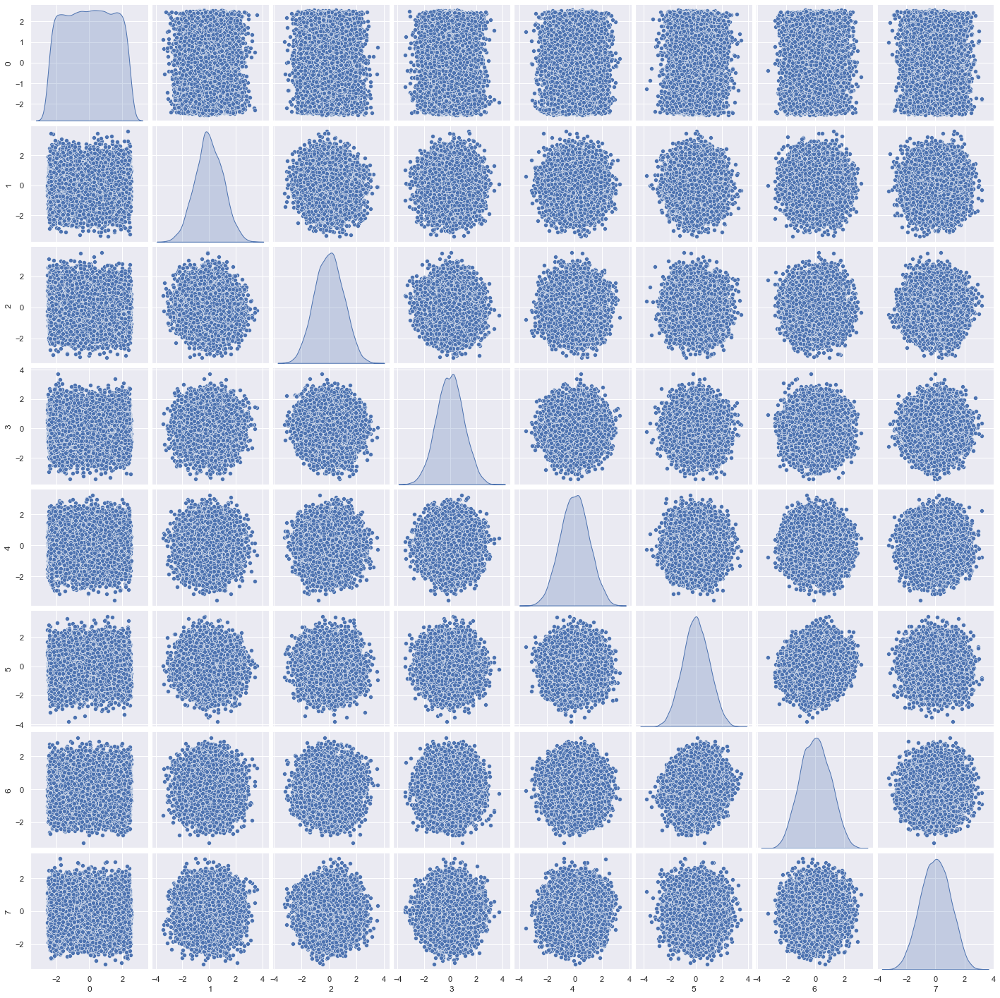

In [20]:
#compare the dimensionality reduction
sns.pairplot(reduced_pca, diag_kind = 'kde') 

## Bank Marketing

In [21]:
#load dataset
df_bank = pd.read_csv('bank-additional-full.csv', sep = ';')
df_bank.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [22]:
#check columns name of dataset
df_bank.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [23]:
#check rows and columns of dataset
df_bank.shape

(41188, 21)

In [24]:
#check missing value
df_bank.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

In [25]:
#check dataset type 
df_bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [26]:
#convert categorical data to numerical data
for i in df_bank[['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome']]:
    le = LabelEncoder()
    df_bank[i] = le.fit_transform(df_bank[i])

df_bank.dtypes

age                 int64
job                 int32
marital             int32
education           int32
default             int32
housing             int32
loan                int32
contact             int32
month               int32
day_of_week         int32
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome            int32
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

In [27]:
#split data
X = df_bank.iloc[:, 0:20].values
y = df_bank.iloc[:, 20].values
print(X)

[[ 5.6000e+01  3.0000e+00  1.0000e+00 ... -3.6400e+01  4.8570e+00
   5.1910e+03]
 [ 5.7000e+01  7.0000e+00  1.0000e+00 ... -3.6400e+01  4.8570e+00
   5.1910e+03]
 [ 3.7000e+01  7.0000e+00  1.0000e+00 ... -3.6400e+01  4.8570e+00
   5.1910e+03]
 ...
 [ 5.6000e+01  5.0000e+00  1.0000e+00 ... -5.0800e+01  1.0280e+00
   4.9636e+03]
 [ 4.4000e+01  9.0000e+00  1.0000e+00 ... -5.0800e+01  1.0280e+00
   4.9636e+03]
 [ 7.4000e+01  5.0000e+00  1.0000e+00 ... -5.0800e+01  1.0280e+00
   4.9636e+03]]


In [28]:
#scale the data to be between -1 and 1
sc = StandardScaler()
X_std = sc.fit_transform(X)

#print standarization
print(X_std)

[[ 1.53303429 -0.20157925 -0.2837415  ...  0.88644656  0.71245988
   0.33167991]
 [ 1.62899323  0.91122681 -0.2837415  ...  0.88644656  0.71245988
   0.33167991]
 [-0.29018564  0.91122681 -0.2837415  ...  0.88644656  0.71245988
   0.33167991]
 ...
 [ 1.53303429  0.35482378 -0.2837415  ... -2.22495344 -1.49518647
  -2.8156966 ]
 [ 0.38152696  1.46762984 -0.2837415  ... -2.22495344 -1.49518647
  -2.8156966 ]
 [ 3.26029527  0.35482378 -0.2837415  ... -2.22495344 -1.49518647
  -2.8156966 ]]


In [29]:
#calculate covariance matrix
cov_mat = np.cov(X_std.T)
print('cov_matrix shape:', cov_mat.shape)
print('Covariance_matrix', cov_mat)

cov_matrix shape: (20, 20)
Covariance_matrix [[ 1.00002428e+00  1.24962177e-03 -3.89762718e-01 -1.17894876e-01
   1.64969297e-01 -1.60336828e-03 -7.36833372e-03  7.02111824e-03
  -2.48778501e-02 -1.75719334e-02 -8.65726029e-04  4.59369202e-03
  -3.43697856e-02  2.43653325e-02  1.97508061e-02 -3.70694468e-04
   8.56735772e-04  1.29374755e-01  1.07676910e-02 -1.77255623e-02]
 [ 1.24962177e-03  1.00002428e+00  2.78981726e-02  1.34124208e-01
  -2.82779342e-02  6.96223509e-03 -1.02091345e-02 -2.51326821e-02
  -3.32141117e-02 -8.44205599e-04 -6.48979861e-03 -6.92346315e-03
  -2.84684340e-02  2.09654169e-02  1.15045357e-02 -8.27132020e-03
  -1.60177979e-02  5.27614394e-02 -7.88037520e-03 -1.95747087e-02]
 [-3.89762718e-01  2.78981726e-02  1.00002428e+00  1.09222163e-01
  -7.94519861e-02  1.04670801e-02  5.78829899e-03 -5.45022433e-02
  -7.62876682e-03  2.20190306e-03  1.02906929e-02 -7.24066877e-03
  -3.79426491e-02  3.86903125e-02  1.91211406e-03 -8.42120866e-02
  -5.74782026e-02 -3.37838718

In [30]:
#calculate eigen values & eigen vectors
eigenvalues, eigenvectors = np.linalg.eig(cov_mat)
print('Eigen Vectors \n%s', eigenvectors)
print('\n Eigen Values \n%s', eigenvalues)

Eigen Vectors 
%s [[ 1.70593474e-02  2.01247841e-01 -5.07045757e-01 -4.60706353e-03
   4.64331702e-03 -1.34337735e-03 -5.66958303e-02  3.76834289e-01
   5.23795234e-01  4.84386766e-01 -5.13163151e-02  1.87264651e-01
  -1.45788879e-02 -4.27777694e-02  1.86076000e-02  4.50168611e-02
   4.81398189e-02  4.29432878e-02  3.77478083e-02  1.24374397e-02]
 [-1.30895083e-02  3.30575274e-02  1.77754777e-01 -1.26254011e-03
  -2.43161460e-03  1.12135310e-03 -1.07646605e-02  1.40762360e-01
  -6.75549744e-03 -4.10248895e-02  2.22235947e-01  4.87760285e-01
  -6.50545950e-02  2.70343348e-01 -2.43163147e-02  4.13858914e-01
  -4.10901623e-01 -4.05421743e-01  1.57911119e-01 -2.25481405e-01]
 [-6.09887517e-02 -1.16729939e-01  4.93357390e-01  7.54345299e-05
   9.82976675e-04 -6.57640386e-04 -3.82622168e-02 -3.02270178e-01
   4.66799358e-01  3.97150893e-01  1.03127528e-01 -1.75838639e-01
  -1.11195740e-03 -3.39026349e-01 -2.40590154e-02 -1.10264889e-01
  -2.68768551e-01 -1.68694342e-01 -2.79918239e-02 -8.954

In [31]:
eig_pairs = [(eigenvalues[index], eigenvectors[:,index]) for index in range(len(eigenvalues))]

#sort the (eigenvalue, eigenvector) pairs from highest to lowest with respect to eigenvalue
eig_pairs.sort()
eig_pairs.reverse()
print(eig_pairs)

#extract the descending ordered eigenvalues and eigenvectors
eigvalues_sorted = [eig_pairs[index][0] for index in range(len(eigenvalues))]
eigvectors_sorted = [eig_pairs[index][1] for index in range(len(eigenvalues))]

#let's confirm our sorting worked, print out eigenvalues
print('\n')
print('Eigenvalues in descending order: \n%s' %eigvalues_sorted)

[(4.269610759183977, array([ 0.01705935, -0.01308951, -0.06098875, -0.04652155,  0.13307394,
       -0.04362107, -0.00120046,  0.258858  , -0.06423578,  0.01369111,
       -0.0220974 ,  0.0938436 ,  0.18740762, -0.2862216 ,  0.11167833,
        0.46164004,  0.36846006,  0.11332738,  0.46232979,  0.43409911])), (1.6847623151829498, array([ 0.20124784,  0.03305753, -0.11672994, -0.03760462,  0.05254014,
       -0.06460947, -0.02333621,  0.25426984,  0.18428215,  0.0406175 ,
        0.07329549, -0.03942168, -0.60657627,  0.25122814,  0.47489374,
        0.01451818,  0.19751955,  0.33663315,  0.00990192, -0.13956666])), (1.541299534638975, array([-0.50704576,  0.17775478,  0.49335739,  0.42693682, -0.32566541,
        0.02652544,  0.0202874 , -0.10342922, -0.19495043,  0.0301344 ,
        0.02090037,  0.03327552, -0.18617861, -0.03443155,  0.26905148,
        0.07808067,  0.0259414 ,  0.05969514,  0.0664227 ,  0.06573399])), (1.35815957497442, array([ 0.37683429,  0.14076236, -0.30227018, 

In [32]:
#decompose standardization using principal component analysis
pca = PCA(n_components = 3)
pca.fit_transform(X_std)

array([[-1.63300091,  1.27697178,  1.55371452],
       [-1.89255894,  1.34530523,  1.73036473],
       [-1.43664953,  0.70351097, -0.17270711],
       ...,
       [ 2.02457075,  0.05891116,  0.67916726],
       [ 2.00263256,  0.12684188,  0.19702108],
       [ 2.83036432, -0.34278744,  2.48630825]])

In [33]:
#input the PCA result to dataframe
df_pca_3 = pd.DataFrame(pca.fit_transform(X_std), columns = ['principal component I', 'principal component II', 
                                                            'principal component III'])
df_pca_3.head()

,principal component I,principal component II,principal component III
0,-1.634051,1.204346,1.704611
1,-1.892040,1.320381,1.729331
2,-1.437439,0.691186,-0.083719
3,-1.606611,0.832566,0.877380
4,-1.546601,1.137027,0.835136


In [34]:
#merge the PCA result to category variable
df_final = pd.concat([df_pca_3, df_bank[['y']]], axis = 1)
df_final.head()

,principal component I,principal component II,principal component III,y
0,-1.634051,1.204346,1.704611,no
1,-1.892040,1.320381,1.729331,no
2,-1.437439,0.691186,-0.083719,no
3,-1.606611,0.832566,0.877380,no
4,-1.546601,1.137027,0.835136,no


In [35]:
#check variance ratio
variance_ratio = pca.explained_variance_ratio_
variance_ratio = np.insert(variance_ratio, 0, 0)
print(variance_ratio)

[0.         0.21347535 0.08423148 0.07705606]


In [36]:
#check cumulative variance 
cumulative_variance = np.cumsum(np.round(variance_ratio, decimals = 3))
print(cumulative_variance)

[0.    0.213 0.297 0.374]


In [37]:
#input all the result to dataframe
df_pc = pd.DataFrame(['','Principal Component I', 'Principal Component II', 'Principal Component III'], 
                     columns = ['Principal Component'])
df_variance_ratio = pd.DataFrame(variance_ratio, columns = ['Variance Ratio'])
df_cummulative_variance = pd.DataFrame(cumulative_variance, columns = ['Cumulative Variance'])

#merge all the result
df_result = pd.concat([df_pc, df_variance_ratio, df_cummulative_variance], axis = 1)
df_result.head()

,Principal Component,Variance Ratio,Cumulative Variance
0,,0.000000,0.000
1,Principal Component I,0.213475,0.213
2,Principal Component II,0.084231,0.297
3,Principal Component III,0.077056,0.374


In [38]:
#visualize of principal component toward variance ratio
fig = px.bar(df_result, x = 'Principal Component', y = 'Variance Ratio', text = 'Variance Ratio', width = 800, 
             color = 'Principal Component')
fig.update_traces(texttemplate = '%{text:.3f}', textposition = 'outside')
fig.show()

In [39]:
#visualize variance ratio towards cumulative variance on principal component
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x = df_result['Principal Component'],
        y = df_result['Cumulative Variance'],
        marker = dict(size = 15, color = "LightSeaGreen")
    ))

fig.add_trace(
    go.Bar(
        x = df_result['Principal Component'],
        y = df_result['Variance Ratio'],
        marker = dict(color = "RoyalBlue")
    ))
fig.show()

In [40]:
#compare principal component I, II, III based on category
fig = px.scatter_3d(df_final, x = 'principal component I', y = 'principal component II', z = 'principal component III',
              color = 'y')

fig.show()

In [41]:
# Reducing from 8 to 4 dimension space
d_reduce = np.array(eigvectors_sorted[0:8]) 
X_std_8D = np.dot(X_std, d_reduce.T) 

#converting array to dataframe for pairplot
reduced_pca = pd.DataFrame(X_std_8D)  
reduced_pca

,0,1,2,3,4,5,6,7
0,1.633893,1.220856,-1.679132,-0.787346,0.443977,0.254886,-0.660905,0.784893
1,1.892403,1.321681,-1.740295,-0.270571,1.174348,-0.239619,-0.684300,0.307109
2,1.437338,0.696879,0.093653,-0.845131,1.091596,0.064370,0.622309,0.333717
3,1.606226,0.835584,-0.858031,-1.413030,0.030683,0.081554,-0.601134,1.048949
4,1.546763,1.153343,-0.822043,-0.360532,1.246052,-0.070921,1.288390,-0.133513
...,...,...,...,...,...,...,...,...
41183,-2.018272,0.504773,-1.853230,0.173742,0.079993,-0.678374,0.232726,0.542818
41184,-1.963537,0.091574,-0.787228,-1.225038,-0.797175,-0.497752,-1.098761,0.873708
41185,-2.021639,0.103653,-0.825927,-0.351653,0.042094,-1.182015,0.270369,0.678826
41186,-2.000972,0.143203,-0.289548,-0.984810,0.210110,-0.523835,-1.185655,0.309410


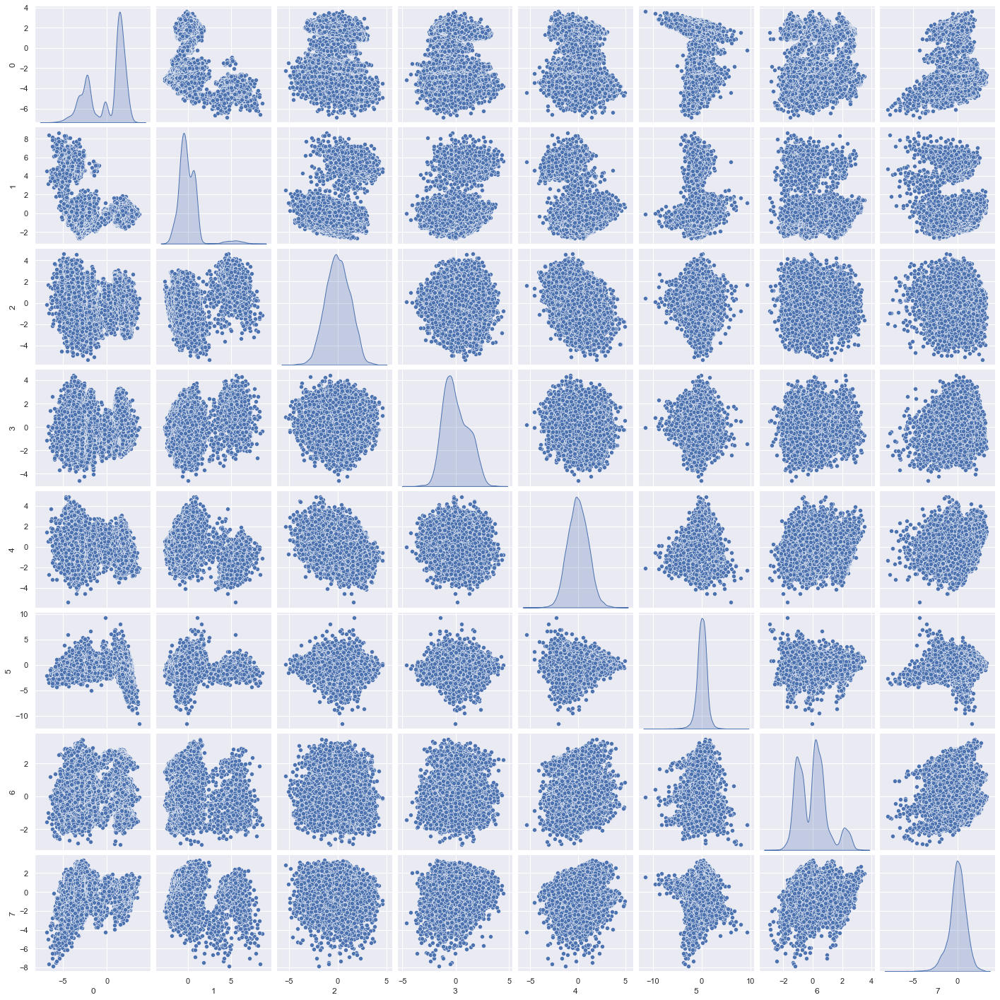

In [42]:
#compare the dimensionality reduction
sns.pairplot(reduced_pca, diag_kind = 'kde') 